In [2]:
import numpy as np
from PIL import Image
import os
import matplotlib.pyplot as plt
import cv2
import torch
import imageio as io
import json
H, W = 512, 1024


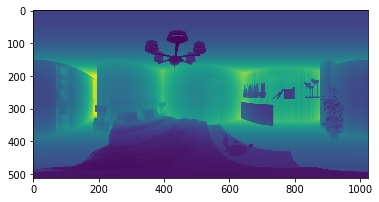

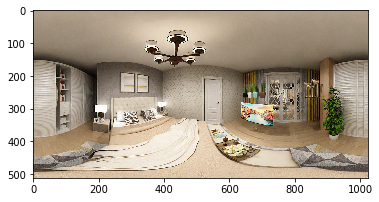

In [13]:
name = '03122_554516'
baseDir = '/home/jessie/datasets/st3d_rgbdxyz/nerf/' + name

rgb = np.array(Image.open('/mnt/home_6T/jessie/st3d/valid/img/scene_03122_554516.png'))
d = np.array(Image.open('/mnt/home_6T/jessie/st3d/valid/depth/scene_03122_554516.png'))

d_max = np.max(d)
d = d / d_max

plt.imshow(d)
plt.show()

plt.imshow(rgb)
plt.show()

# Fill empty depth by interpolating neighbors (optional)
Some depth map in the dataset might be empty, for small regions, we fill them with neighbor values.

In [13]:
idx_0, idx_1 = np.where(d==0)
idx_0, idx_1 = idx_0[ 420 > idx_0], idx_1[ 420 > idx_0] 
idx_0, idx_1 = idx_0[idx_0 > 80], idx_1[ idx_0 > 80] 

d_fill = np.zeros(d.shape)

d_fill[idx_0, idx_1] = 1

from itertools import groupby
from operator import itemgetter


for i in range(512):
    y_idx = np.where(d_fill[i]>0)[0]
    
    if len(y_idx)==0: continue
    if len(y_idx) == 1:
        d_fill[i, y_idx[0]] = (d[i, y_idx[0]-1] + d[i, y_idx[0]+1]) / 2
        continue
    interval = []
    
    gaps = [[s, e] for s, e in zip(y_idx, y_idx[1:]) if s+1 < e]
    edges = np.concatenate([y_idx[:1], np.array(sum(gaps, [])), y_idx[-1:]])
    
    interval = [[int(s), int(e)+1] for s, e in zip(edges[::2], edges[1:][::2])]
    if interval[0][0] == 0:
        interval[0][0] = interval[-1][0] - 1024
        interval = interval[:-1]

    for s, e in interval:
        if s < 0:
            interp = np.linspace(d[i, s-1], d[i, e+1], e-s)
            d_fill[i, s:] = interp[:-s]
            d_fill[i, :e] = interp[-s:]
        else:
            d_fill[i, s:e] = np.linspace(d[i, s-1], d[i, e+1], e-s)
plt.imshow(d)
plt.show()
plt.imshow(d_fill+d)
plt.show()

d = d + d_fill

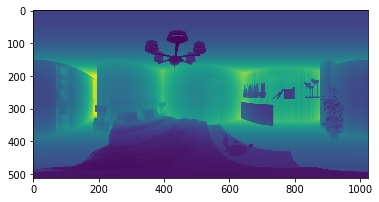

In [14]:
original_d = d * d_max
plt.imshow(original_d)
plt.show()

In [9]:
def translate(crd, rgb, d, cam=[]):
    H, W = rgb.shape[0], rgb.shape[1]
    d = np.where(d==0, -1, d)
    
    # move coordinates and calculate new depth
    tmp_coord = crd - cam
    new_d = np.sqrt(np.sum(np.square(tmp_coord), axis=2))
    
    
    # normalize: /depth
    new_coord = tmp_coord / new_d.reshape(H,W,1)
    new_depth = np.zeros(new_d.shape)
    img = np.zeros(rgb.shape)

    
    # backward: 3d coordinate to pano image
    [x, y, z] = new_coord[..., 0], new_coord[..., 1], new_coord[..., 2]
    

    idx = np.where(new_d>0)
    
    # theta: 上下角度, phi: 左右角度
    theta = np.zeros(y.shape)
    phi = np.zeros(y.shape)
    x1 = np.zeros(z.shape)
    y1 = np.zeros(z.shape)

    theta[idx] = np.arctan2(y[idx], np.sqrt(np.square(x[idx]) + np.square(z[idx])))
    phi[idx] = np.arctan2(-z[idx], x[idx])
    
    x1[idx] = (0.5 - theta[idx] / np.pi) * H #- 0.5  # (1 - np.sin(theta[idx]))*H/2 - 0.5
    y1[idx] = (0.5 - phi[idx]/(2*np.pi))*W #- 0.5
    x, y = np.floor(x1).astype('int'), np.floor(y1).astype('int')
    
    img = np.zeros(rgb.shape)
    # Mask out
    mask = (new_d > 0) & (H > x) & (x > 0) & (W > y) & (y > 0)
    x = x[mask]
    y = y[mask]
    new_d = new_d[mask]
    rgb = rgb[mask]
    # Give smaller depth pixel higher priority
    reorder = np.argsort(-new_d)
    x = x[reorder]
    y = y[reorder]
    new_d = new_d[reorder]
    rgb = rgb[reorder]
    # Assign
    new_depth[x, y] = new_d
    img[x, y] = rgb
                

    depth_margin = 4
    for i in range(depth_margin, H, 2):
        for j in range(depth_margin, W, 2):

            x_l = max(0, i-depth_margin)
            x_r = min(H, i+depth_margin)
            y_l, y_r = max(0, j-depth_margin), min(W, j+depth_margin)
            
            index = np.where(new_depth[x_l:x_r, y_l:y_r]>0)
            if len(index[0]) == 0: continue 
            mean = np.median(new_depth[x_l:x_r, y_l:y_r][index]) # median
            target_index = np.where(new_depth[x_l:x_r, y_l:y_r] > mean*1.3)
            
            if len(target_index[0]) > depth_margin ** 2 // 2:
                # reduce block size
                img[x_l:x_r, y_l:y_r][target_index] = 0#np.array([255.0, 0.0, 0.0])
                new_depth[x_l:x_r, y_l:y_r][target_index] = 0
    
    
    mask = (new_depth != 0).astype(int)

    return img, new_depth.reshape(H,W,1), tmp_coord, cam.reshape(1, 1, 3), mask

# Augment single source image to 100 samples

In [15]:
# test camera pose
if not os.path.exists(baseDir): os.mkdir(baseDir)
if not os.path.exists(os.path.join(baseDir, 'rm_occluded')): os.mkdir(os.path.join(baseDir, 'rm_occluded'))
if not os.path.exists(os.path.join(baseDir, 'test')): os.mkdir(os.path.join(baseDir, 'test'))
io.imsave(os.path.join(baseDir, name + '_rgb.png'), rgb)
if baseDir.split('/')[-2] == 'mp3d':
    io.imsave(os.path.join(baseDir, name + '_depth.exr'), np.float32(original_d))
    print(os.path.join(baseDir, name + '_depth.exr'))
else:
    Image.fromarray(np.uint8(d*255)).save(os.path.join(baseDir, name + '_d.png'))


0.33006648608717065 -0.20625461708938683
0.3310743249810641 -0.20685615760886936
Num  100


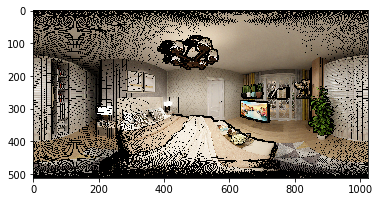

Num  101


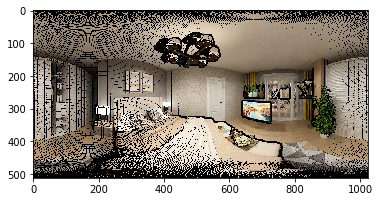

Num  102


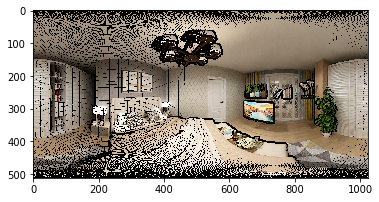

Num  103


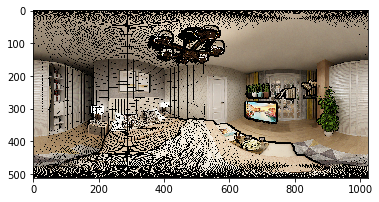

Num  104


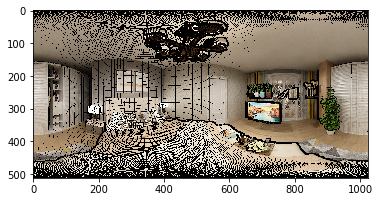

Num  105


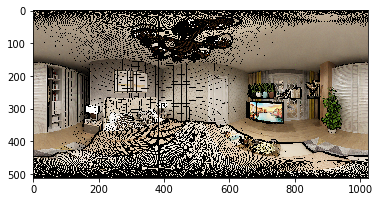

Num  106


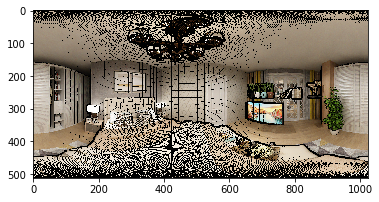

Num  107


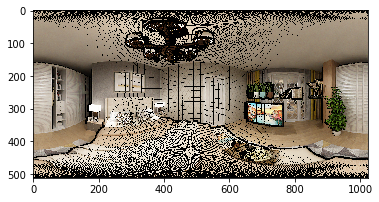

Num  108


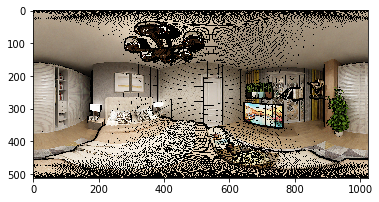

Num  109


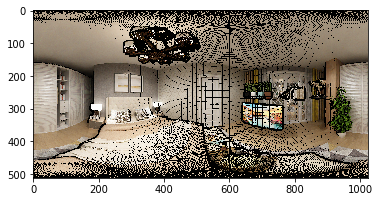

Num  110


/home/jessie/.local/lib/python3.5/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()


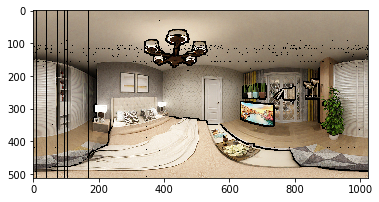

In [18]:
# normalize to [0, 1]
d = d.reshape(rgb.shape[0], rgb.shape[1], 1) / np.max(d)
d = np.where(d==0, 1, d)


H, W = 512, 1024
_y = np.repeat(np.array(range(W)).reshape(1,W), H, axis=0)
_x = np.repeat(np.array(range(H)).reshape(1,H), W, axis=0).T


_theta = (1 - 2 * (_x) / H) * np.pi/2 # latitude
_phi = 2*np.pi*(0.5 - (_y)/W ) # longtitude

axis0 = (np.cos(_theta)*np.cos(_phi)).reshape(H, W, 1)
axis1 = np.sin(_theta).reshape(H, W, 1)
axis2 = (-np.cos(_theta)*np.sin(_phi)).reshape(H, W, 1)
coord = np.concatenate((axis0, axis1, axis2), axis=2)*d

scale = 0.6
cam_pos = []

################ XZ ONLY ################
max_, min_ = coord[256, 512, 0]*scale, coord[256, 0, 0]*scale
# import pdb; pdb.set_trace()
pos_ = np.stack([np.linspace(max_, min_, 50), np.zeros(50), np.zeros(50)], axis=1)
cam_pos.append(pos_)
print(max_, min_)
# Z
max_, min_ = coord[256, 640, 2]*scale, coord[256, 128, 2]*scale
pos_ = np.stack([np.zeros(50), np.zeros(50), np.linspace(max_, min_, 50)], axis=1)
cam_pos.append(pos_)
print(max_, min_)
################ XY ONLY ################

cam_pos = np.concatenate(cam_pos, axis=0)
# save training, testnig camera poses
with open(os.path.join(baseDir, 'cam_pos.txt'), 'w') as fp:
    for p in cam_pos: fp.write('%f %f %f\n' % (p[0], p[1], p[2])) 

test_pos = np.array([[-0.05,      0.,       -0.05    ],
                    [-0.03,      0.,       -0.05    ],
                    [-0.01,      0.,       -0.05    ],
                    [ 0.01,      0.,       -0.05    ],
                    [ 0.03,      0.,       -0.05    ],
                    [ 0.05,      0.,       -0.05    ],
                    [ 0.05,      0.,       -0.03    ],
                    [ 0.05,      0.,       -0.01    ],
                    [ 0.05,      0.,        0.01    ],
                    [ 0.05,      0.,        0.03    ]])

with open(os.path.join(baseDir, 'test', 'cam_pos.txt'), 'w') as fp:
    for p in test_pos: fp.write('%f %f %f\n' % (p[0], p[1], p[2])) 

cam_pos = np.concatenate([cam_pos, test_pos, np.array([0.0, 0.0, 0.0]).reshape(1,3)])


images = []
depth = []
for n, cam in enumerate(cam_pos):
    if n<100: continue
    img = rgb.copy()
    print("Num ", n)
    tmp_coord = np.concatenate((axis0, axis1, axis2), axis=2)
    img1, d1, _, _, mask1 = translate(coord, rgb, d, cam)
    img2, d2, _, _, mask2 = translate(tmp_coord*d1, img1, d1, -cam)
    
    
    plt.imshow(np.uint8(img1))
    plt.show()
    
    if n < 100:
        Image.fromarray(np.uint8(mask2*255)).save(os.path.join(baseDir, 'rm_occluded', 'mask_%d.png' % n))
    elif n < 111:
        if not os.path.exists('test'):
            os.makedirs('test')
        Image.fromarray(np.uint8(img1)).save(os.path.join(baseDir, 'test', 'rgb_%d.png' % (n-100)))
    images.append(img)


# For generate data from 5 multi-view panorama

In [191]:
name = 'Vt2qJdWjCF2_augmented_100'
sourceDir = '/mnt/home_6T/jessie/mp3d/mp3d_rgbd/Vt2qJdWjCF2'
baseDir = '/home/jessie/datasets/mp3d/' + name

In [216]:
# read all images from cam_pos.json
with open(baseDir+'/cam_pos.json' , 'r') as reader:
    poses = json.loads(reader.read())
fname = list(poses.keys())
# Cam origin
cam_origin = np.array([poses[key] for key in poses if key[:5] != 'stats'])
center = cam_origin[:-3].mean(axis=0)
cam_origin = cam_origin - center

# images, ray_dir, depth, gradients
rgb, depth, mask = [], [], []
max_depth = -1
n = 0
img_names = []
for f in fname:
    if f[:5] == 'stats': continue
    img_name = f.split('/')[-1]
    img_names.append(img_name)
    img = np.asarray(Image.open(os.path.join(sourceDir, img_name+'_rgb.png')))
    d = cv2.imread(os.path.join(sourceDir, img_name+'_depth.exr'), cv2.IMREAD_ANYDEPTH)
    d = d.astype(np.float)
    if n != len(fname)-1:
        max_depth = max(max_depth, np.max(d))

    rgb.append(img)
    depth.append(d)
    mask.append((d == 0).astype(int))
    n += 1

# normalize by max depth in training set
cam_origin = cam_origin / max_depth
depth = np.array(depth) / max_depth

In [195]:
# test camera pose
if not os.path.exists(baseDir): os.mkdir(baseDir)
if not os.path.exists(os.path.join(baseDir, 'rm_occluded')): os.mkdir(os.path.join(baseDir, 'rm_occluded'))
if not os.path.exists(os.path.join(baseDir, 'test')): os.mkdir(os.path.join(baseDir, 'test'))
if not os.path.exists(os.path.join(baseDir, 'val')): os.mkdir(os.path.join(baseDir, 'val'))
for i in range(len(rgb)):
    io.imsave(os.path.join(baseDir, img_names[i] + '_rgb.png'), rgb[i])
    Image.fromarray(np.uint8(depth[i]*255)).save(os.path.join(baseDir, img_names[i] + '_d.png'))
# io.imsave(os.path.join(baseDir, name + '_d.png'), np.uint8(d*255))

In [221]:
# making correct training data
import numpy as np
from PIL import Image
import os
import math


H, W = 512, 1024
_y = np.repeat(np.array(range(W)).reshape(1,W), H, axis=0)
_x = np.repeat(np.array(range(H)).reshape(1,H), W, axis=0).T


# _theta = np.arcsin(1 - 2*(_x+0.5)/H) # latitude
_theta = (1 - 2 * (_x + 0.5) / H) * np.pi/2
_phi = 2*math.pi*(0.5 - (_y+0.5)/W ) # longtitude


axis0 = (np.cos(_theta)*np.cos(_phi)).reshape(H, W, 1)
axis1 = np.sin(_theta).reshape(H, W, 1)
axis2 = (-np.cos(_theta)*np.sin(_phi)).reshape(H, W, 1)
coord = np.concatenate((axis0, axis1, axis2), axis=2)

scale = 0.6
cam_pos = []
n = 20
for i in range(len(rgb)-1):
    cur_coord = coord * depth[i][..., None]
    # X
    max_, min_ = cur_coord[256, 512, 0]*scale, cur_coord[256, 0, 0]*scale #np.max(cur_coord[..., 0])*scale, np.min(cur_coord[..., 0])*scale
    pos_ = np.linspace(np.array([max_] + [0.0]*2), np.array([min_] + [0.0]*2), 7)
    cam_pos.append(pos_)
    print(max_, min_)
    # Y
    max_, min_ = np.max(cur_coord[..., 1])*scale, np.min(cur_coord[..., 1])*scale
    pos_ = np.linspace(np.array([0.0] + [max_] + [0.0]), np.array([0.0] + [min_] + [0.0]), 6)
    cam_pos.append(pos_)
    print(max_, min_)
    # Z
    max_, min_ = cur_coord[256, 384, 2]*scale, cur_coord[256, 128, 2]*scale #np.max(cur_coord[..., 2])*scale, np.min(cur_coord[..., 2])*scale
    pos_ = np.linspace(np.array([0.0]*2 + [max_]), np.array([0.0]*2 + [min_]), 7)
    cam_pos.append(pos_)
    print(max_, min_)

n = 10
cur_coord = coord * depth[-1][..., None]
test_pos = np.linspace(np.array([0.0, 0.0, -0.15]), np.array([0.0, 0.0, 0.15]), n)
test_pos = np.concatenate([test_pos, cam_origin[-1][None, ...]], axis=0)


# save training, testnig camera poses
cam_pos = np.concatenate(cam_pos, axis=0)
with open(os.path.join(baseDir, 'cam_pos.txt'), 'w') as fp:
    for p in cam_pos: fp.write('%f %f %f\n' % (p[0], p[1], p[2])) 

with open(os.path.join(baseDir, 'test', 'cam_pos.txt'), 'w') as fp:
    for p in test_pos: fp.write('%f %f %f\n' % (p[0], p[1], p[2])) 

cam_pos = np.concatenate([cam_pos, test_pos, cam_origin[-1][None, ...]], axis=0)

0.1729638892278884 -0.04988746147138109
0.18657056425861815 -0.09194760011258567
-0.030609795278740012 -0.1986932870447181
0.12848154929487882 -0.08803365414649106
0.1839045559877014 -0.09033849493103131
-0.03711825085617312 -0.20441635808958072
0.0 -0.061654592093194675
0.14244110237958463 -0.08919438435423012
-0.03075564302277213 -0.13214424297176414
0.1589985034349668 -0.04577543121013195
0.18351915986940906 -0.09020820316711135
-0.13148174124495116 -0.045674509300346014
0.15320545451345857 -0.1379987010944995
0.17739506321247125 -0.1195081545423891
-0.0363343192320005 -0.04226267848513944


Num  0 0


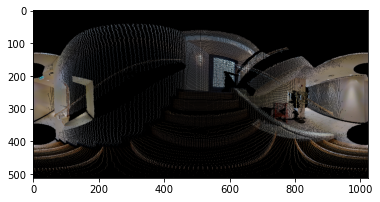

Num  1 0


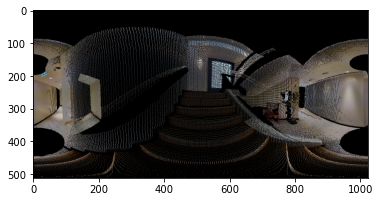

Num  2 0


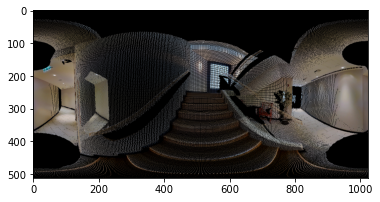

Num  3 0


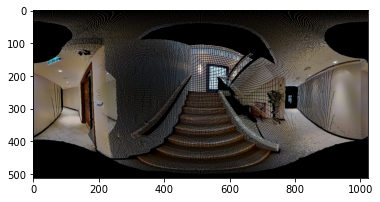

Num  4 0


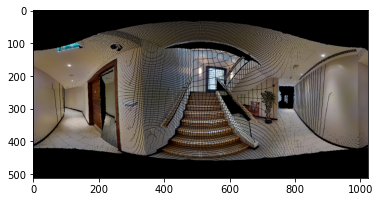

Num  5 0


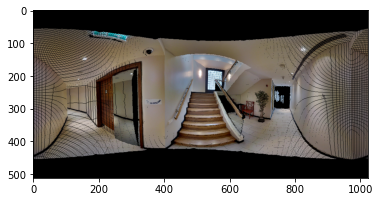

Num  6 0


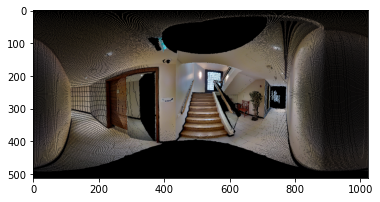

Num  7 0


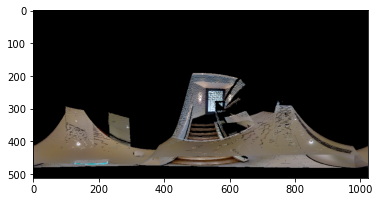

Num  8 0


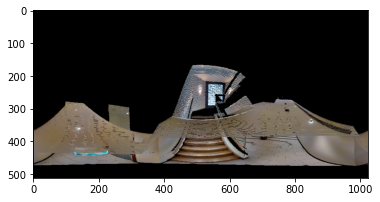

Num  9 0


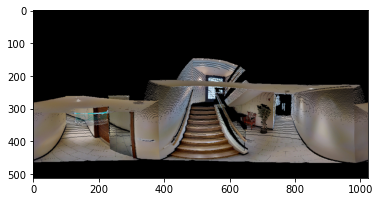

Num  10 0


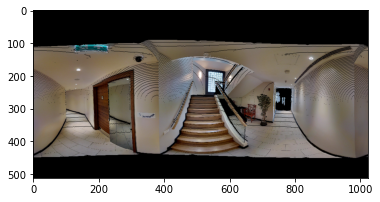

Num  11 0


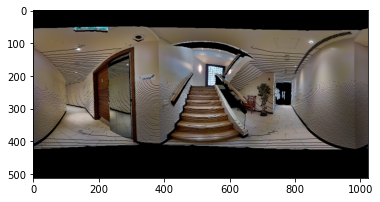

Num  12 0


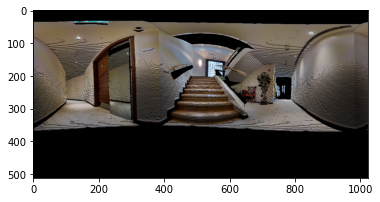

Num  13 0


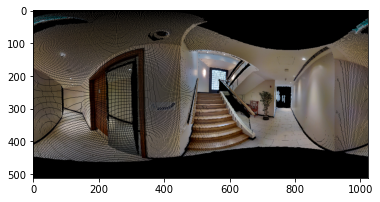

Num  14 0


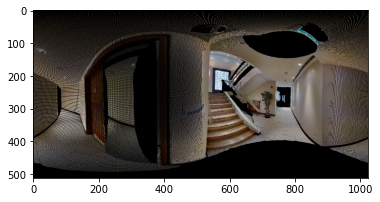

Num  15 0


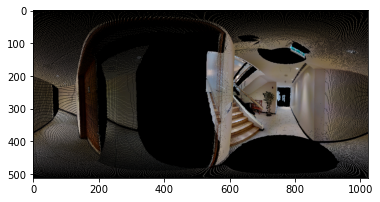

Num  16 0


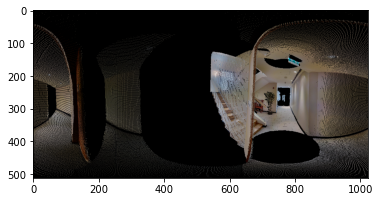

Num  17 0


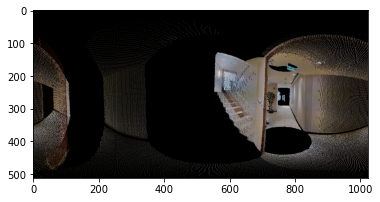

Num  18 0


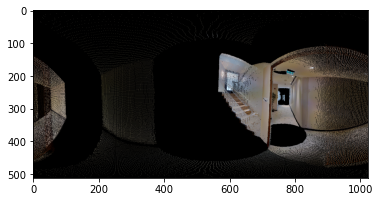

Num  19 0


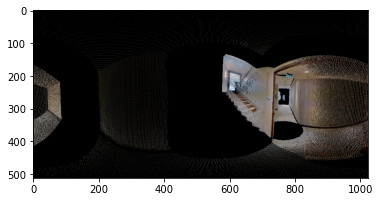

Num  20 1


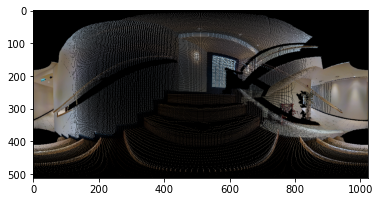

Num  21 1


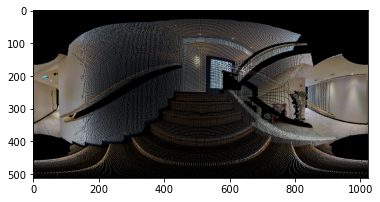

Num  22 1


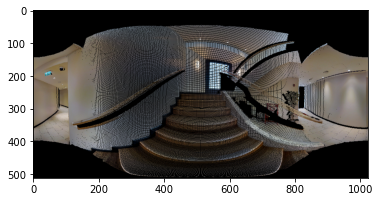

Num  23 1


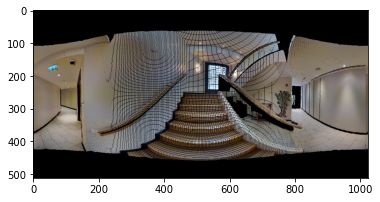

Num  24 1


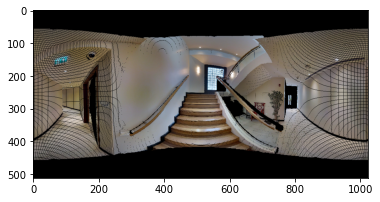

Num  25 1


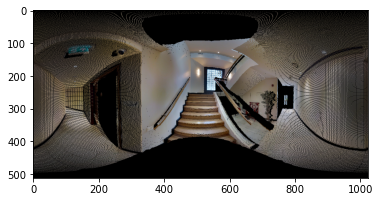

Num  26 1


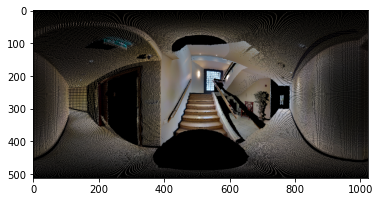

Num  27 1


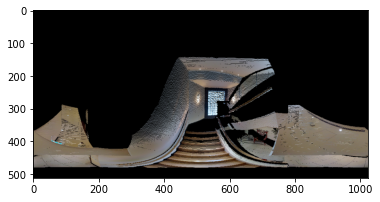

Num  28 1


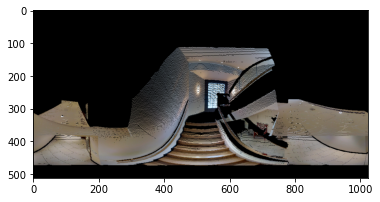

Num  29 1


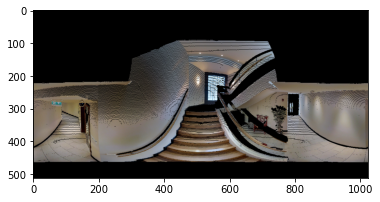

Num  30 1


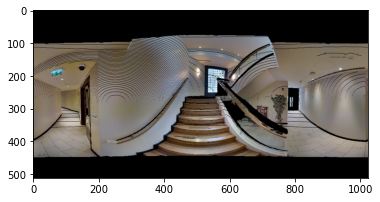

Num  31 1


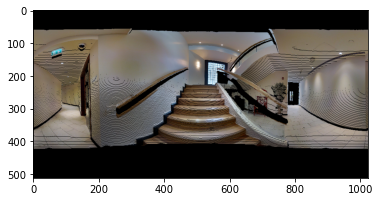

Num  32 1


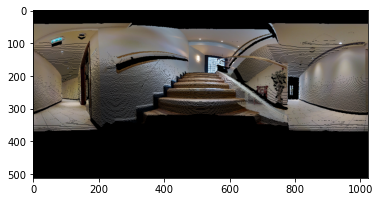

Num  33 1


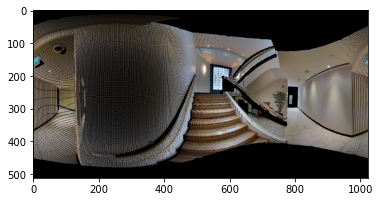

Num  34 1


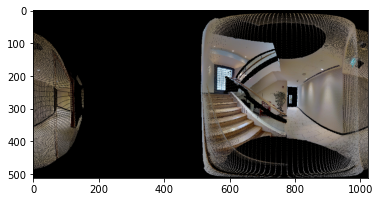

Num  35 1


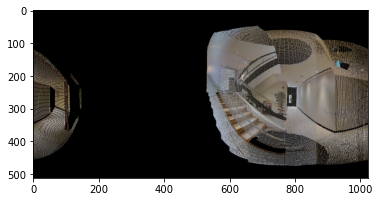

Num  36 1


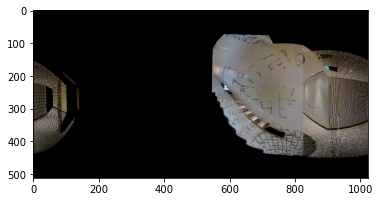

Num  37 1


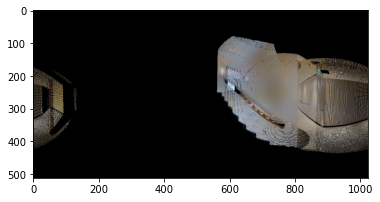

Num  38 1


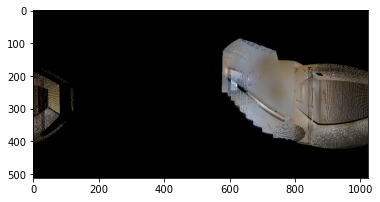

Num  39 1


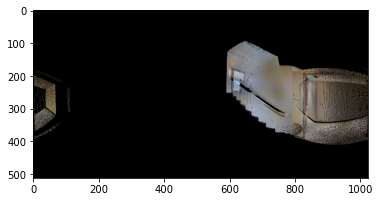

Num  40 2


/home/jessie/anaconda3/envs/nerf/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()


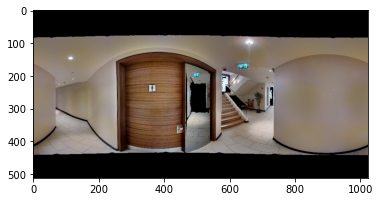

Num  41 2


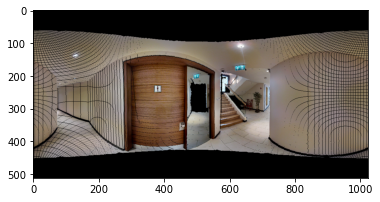

Num  42 2


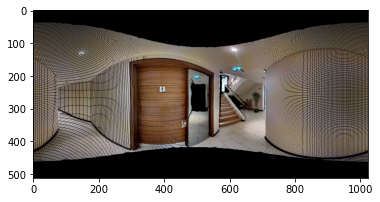

Num  43 2


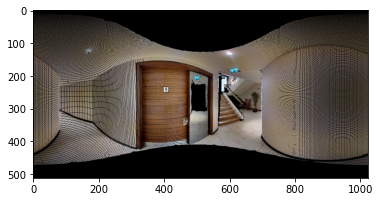

Num  44 2


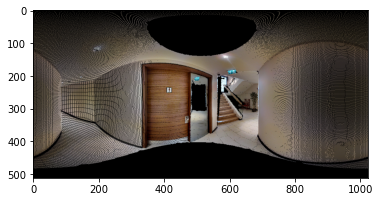

Num  45 2


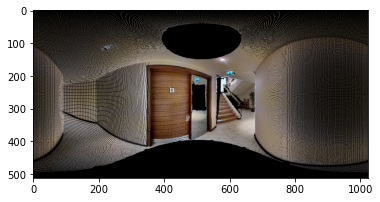

Num  46 2


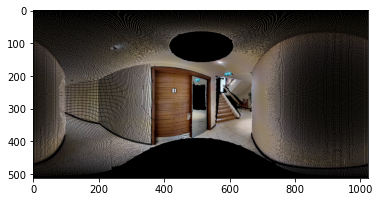

Num  47 2


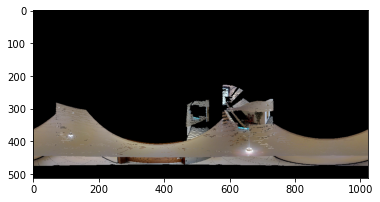

Num  48 2


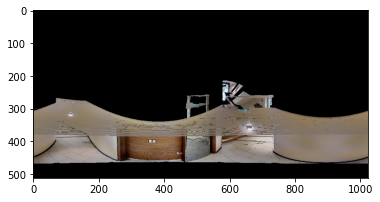

Num  49 2


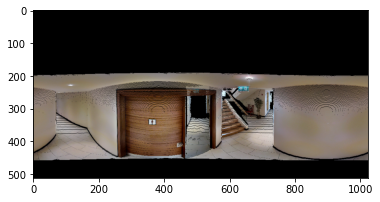

Num  50 2


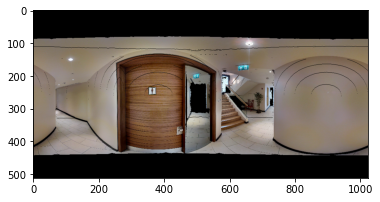

Num  51 2


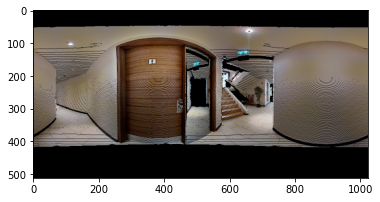

Num  52 2


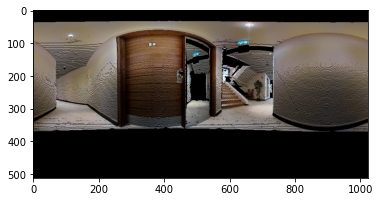

Num  53 2


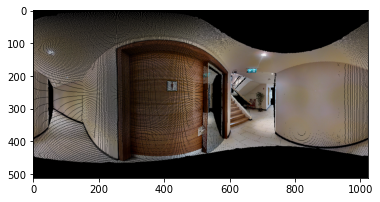

Num  54 2


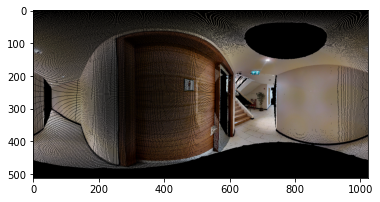

Num  55 2


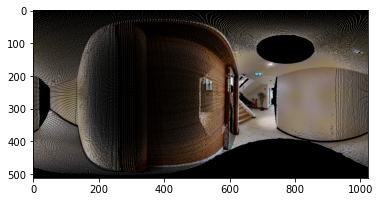

Num  56 2


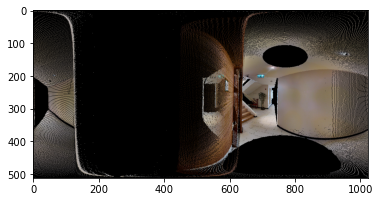

Num  57 2


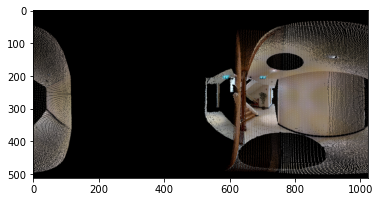

Num  58 2


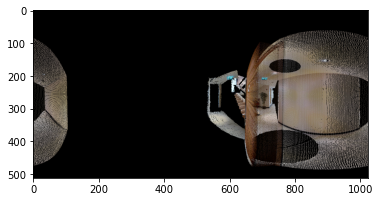

Num  59 2


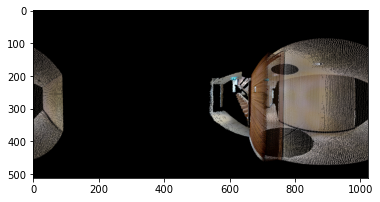

Num  60 3


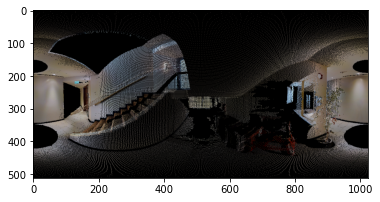

Num  61 3


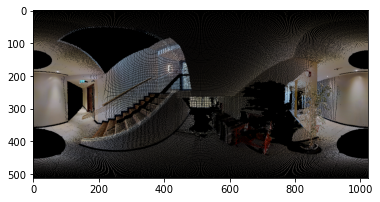

Num  62 3


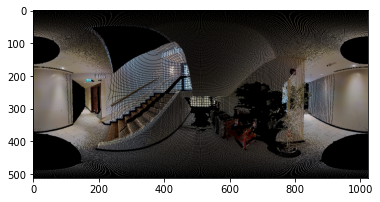

Num  63 3


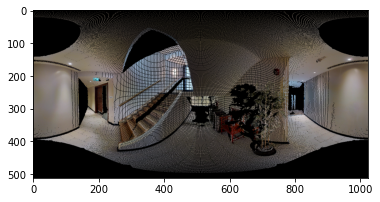

Num  64 3


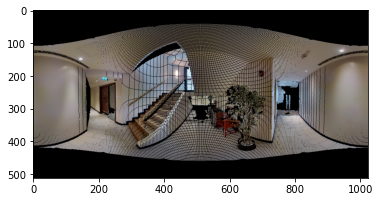

Num  65 3


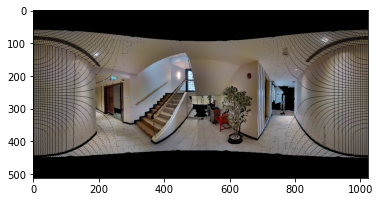

Num  66 3


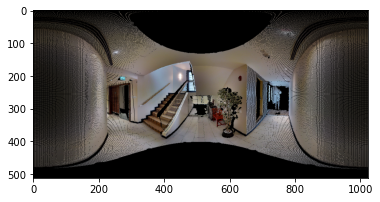

Num  67 3


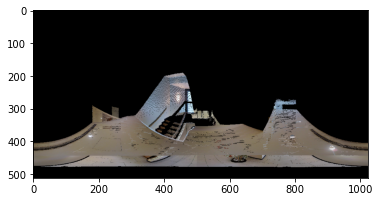

Num  68 3


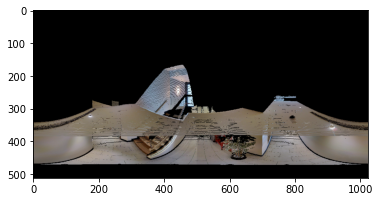

Num  69 3


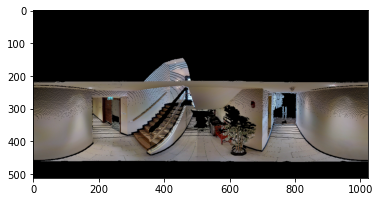

Num  70 3


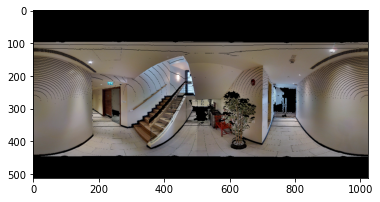

Num  71 3


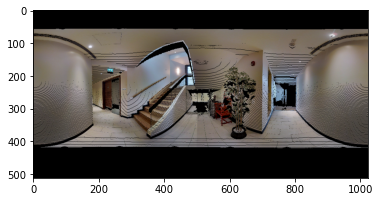

Num  72 3


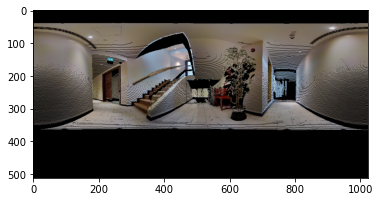

Num  73 3


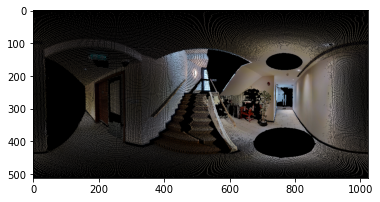

Num  74 3


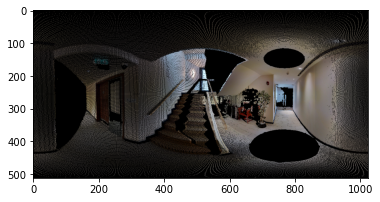

Num  75 3


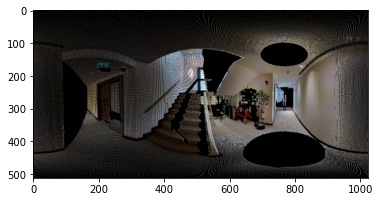

Num  76 3


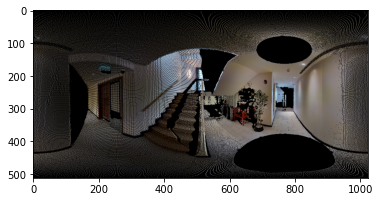

Num  77 3


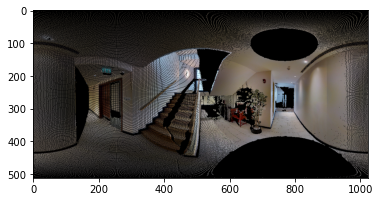

Num  78 3


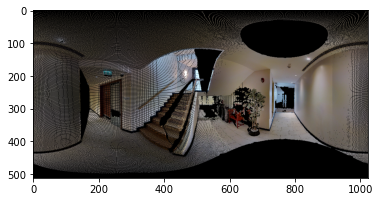

Num  79 3


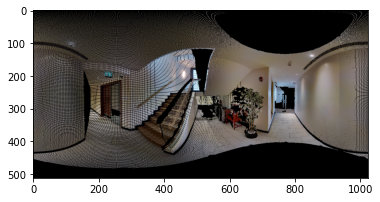

Num  80 4


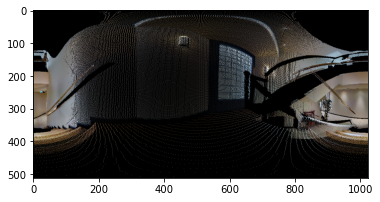

Num  81 4


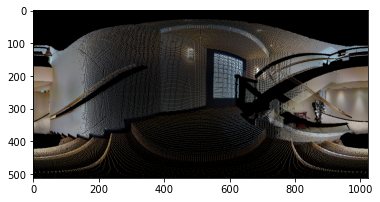

Num  82 4


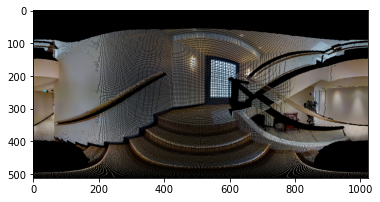

Num  83 4


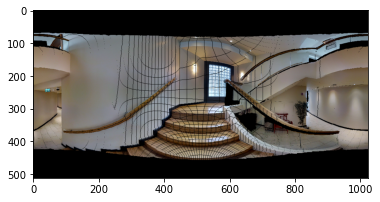

Num  84 4


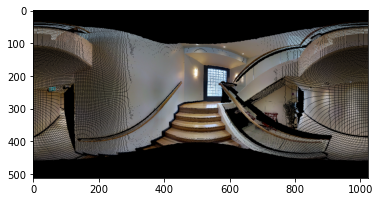

Num  85 4


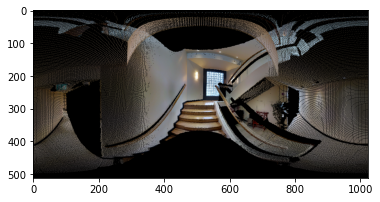

Num  86 4


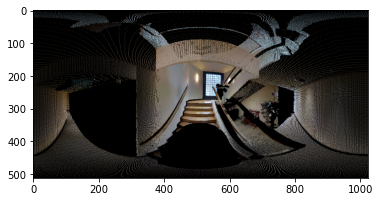

Num  87 4


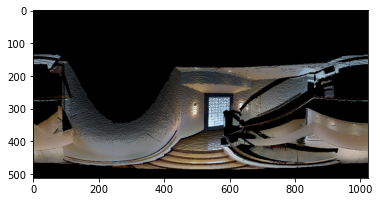

Num  88 4


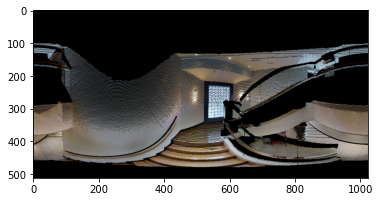

Num  89 4


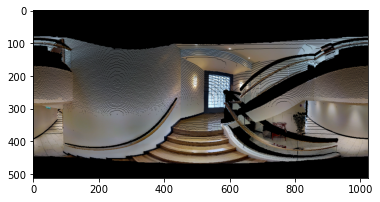

Num  90 4


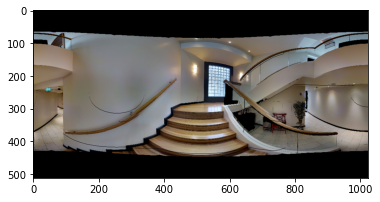

Num  91 4


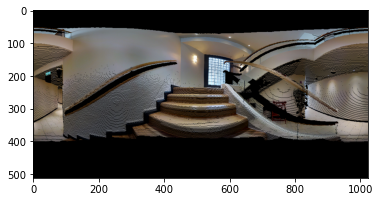

Num  92 4


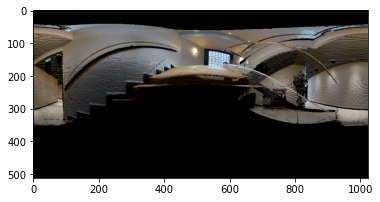

Num  93 4


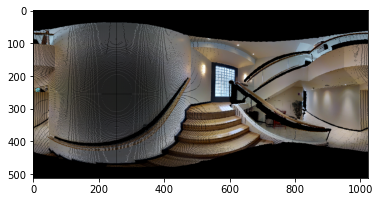

Num  94 4


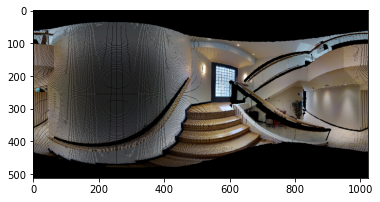

Num  95 4


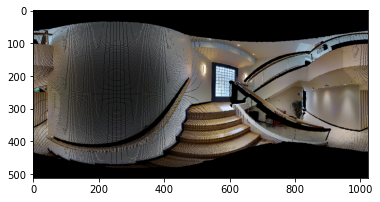

Num  96 4


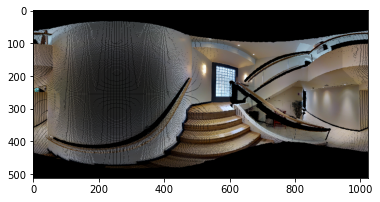

Num  97 4


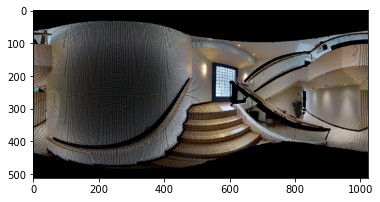

Num  98 4


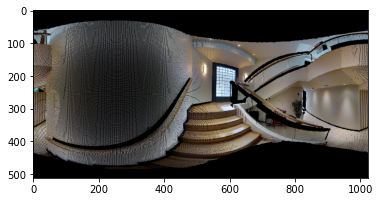

Num  99 4


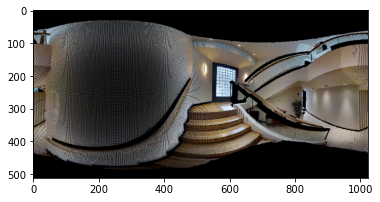

Num  100 -1


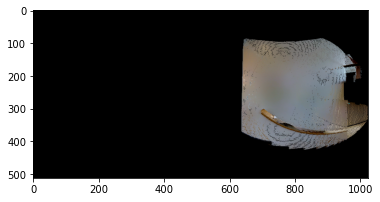

Num  101 -1


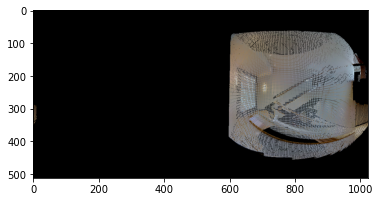

Num  102 -1


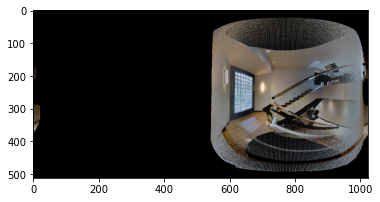

Num  103 -1


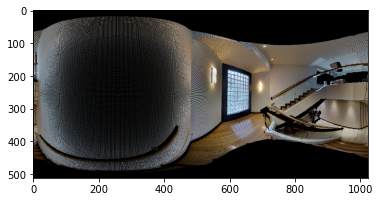

Num  104 -1


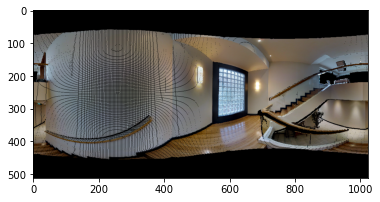

Num  105 -1


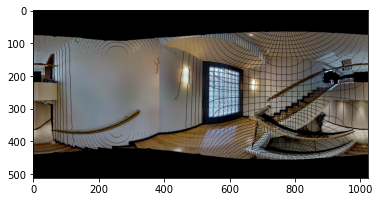

Num  106 -1


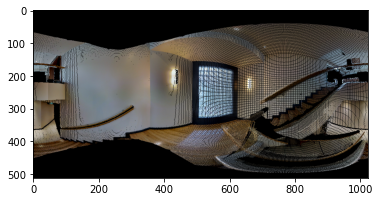

Num  107 -1


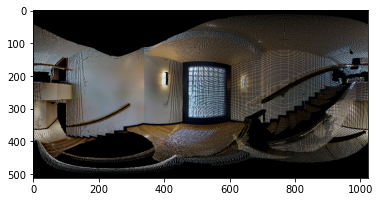

Num  108 -1


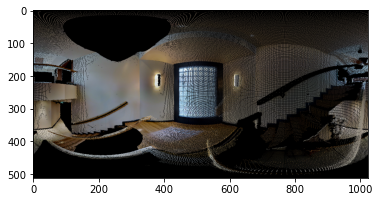

Num  109 -1


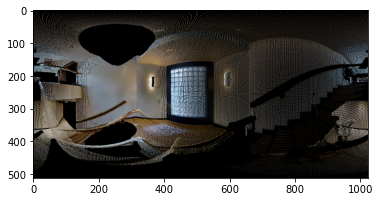

Num  110 -1


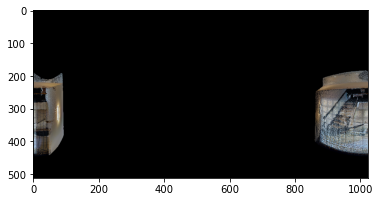

Num  111 -1


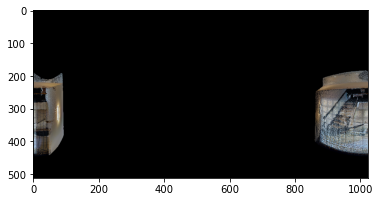

In [222]:
for n, cam in enumerate(cam_pos):
    if n<100:
        idx = n // 20
    else:
        idx = -1
    img = rgb[idx].copy()
    print("Num ", n, idx)
    tmp_coord = np.concatenate((axis0, axis1, axis2), axis=2)
    d = depth[idx][..., None]
    img1, d1, _, _, mask1 = translate(coord*d, rgb[idx], d, cam)
    img2, d2, _, _, mask2 = translate(coord*d1, img1, d1, -cam)

    plt.imshow(np.uint8(img1))
    plt.show()
    
    if n < 100:
        mask = mask2.reshape(H, W, 1)
        img = img * mask + np.array([0.0, 255.0, 0.0]) * (1-mask)
        Image.fromarray(np.uint8(mask2)).save(os.path.join(baseDir, 'rm_occluded', 'rgb_%d.png' % n))
    else:
        mask = mask1.reshape(H, W, 1)
        img = img1 * mask + np.array([0.0, 255.0, 0.0]) * (1-mask)
        Image.fromarray(np.uint8(img)).save(os.path.join(baseDir, 'test', 'rgb_%d.png' % (n-100)))

